# A Comprehensive Benchmark of CosMAP for High-Dimensional Data Visualization

## Comparative Evaluation with PaCMAP, UMAP, LocalMAP, t-SNE, TriMAP, PHATE, PCA, HNNE, InfoNCE-t-SNE, Neg-t-SNE, and NCVis Across Diverse Datasets


## Input data


The publicly distributable benchmark data can be downloaded here:

**[Click here to download the benchmark datasets](https://drive.google.com/drive/folders/1gYJ5RwJA8vg4CTSZzwpPbxlgAI4KibcM?usp=drive_link)**

After downloading the data, place all `.npy` files in a directory named:

```text
data_benchmark/
```

The expected structure is:

```text
data_benchmark/
├── 20NG.npy
├── 20NG_labels.npy
├── coil_20.npy
├── coil_20_labels.npy
├── cortex.npy
├── cortex_labels.npy
├── fmnist.npy
├── fmnist_labels.npy
├── heart_cell_atlas.npy
├── heart_cell_atlas_labels.npy
├── mnist.npy
├── mnist_labels.npy
├── paul15.npy
├── paul15_labels.npy
├── pbmc.npy
├── pbmc_labels.npy
├── retina.npy
├── retina_labels.npy
└── ...
```


Each dataset is represented by two NumPy files:

* `<dataset>.npy`: the high-dimensional input data matrix.
* `<dataset>_labels.npy`: the corresponding class, cell-type, or population labels used for visualization and evaluation.

For example:

```text
mnist.npy
mnist_labels.npy
```

The directory contains image, text, single-cell RNA-sequencing, synthetic, and genealogical relatedness datasets, including MNIST, Fashion-MNIST, COIL-20, 20 Newsgroups, Retina, Cortex, PBMC, Paul15, Heart Cell Atlas datasets.

Most datasets used in this benchmark are publicly available. The `kinship_rrq` and `kinship_cartagene` datasets contain genealogical relatedness information and cannot be distributed publicly because they are subject to privacy, ethical, and data-access restrictions.


Then define the input directory in Python:

```python
from pathlib import Path

DATA_PATH = Path("/your/path/to/the/folder/data_benchmark/")
```



> **Note:** The kinship datasets are not included in this public download. Users without authorized access should remove `kinship_rrq` and `kinship_cartagene` from `DATA_NAMES` before running the benchmark.


In [23]:
from cosmapdr import CosMAP
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import time
import pacmap
import umap

In [19]:
import sys
print(sys.executable)

import numpy as np
import scipy
import pandas as pd
import sklearn
import matplotlib

print("numpy:", np.__version__)
print("scipy:", scipy.__version__)
print("pandas:", pd.__version__)
print("sklearn:", sklearn.__version__)

/lustre10/scratch/fenosoa/balsac_venv/bin/python
numpy: 2.4.2
scipy: 1.17.0
pandas: 3.0.0
sklearn: 1.8.0


In [3]:
from pathlib import Path
from tqdm import tqdm

import benchmark_pipeline


%load_ext autoreload
%autoreload 2
from benchmark_pipeline import run_dimensionality_reduction_benchmark

In [12]:
import matplotlib 
%matplotlib inline



%load_ext autoreload
%autoreload 2
from plot_all_datasets import plot_embeddings_comparison

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Generating the 2D embeddings

The figures in this notebook are generated from saved two-dimensional embeddings. The embeddings can be produced either on a computing cluster using the provided Slurm job-array scripts or directly from Python on a local machine.

### Option 1: Run the benchmark on a computing cluster



1. Create and activate a virtual environment:

```bash
# Create virtual environment
python3 -m venv .venv

# Activate virtual environment
# On macOS/Linux:
source .venv/bin/activate

# On Windows:
# .venv\Scripts\activate
```

2. Install all the packages for benchmarking:

```bash
pip install -r requirements.txt
```
3. Clone the CosMAP-dr repository and go to the `experiments` directory and submit the job array:
```bash
git clone https://github.com/FenosoaRandrianjatovo/CosMAP-dr.git
cd CosMAP-dr/experiments

bash submit_benchmark_array.sh 42 3
```

Here:

* `42` is the random seed.
* `3` is the maximum number of datasets processed simultaneously.
* Each array task processes one dataset and runs all dimensionality-reduction methods.

After the jobs finish, the results are saved in:

```text
comparison_with_seed_42/
```

This directory contains:

* One combined embedding dictionary for each dataset:

```text
all_embeddings_dict_42_<dataset>.npy
```

* Timing and error information for each dataset.
* Individual `.npy` embedding files for each dimensionality-reduction method when `save_individual_files=True`.

Store the  saved path into RESULTS_DIR
```python
from pathlib import Path

RESULTS_DIR = Path("comparison_with_seed_42")
```



### Option 2: Generate the embeddings without a cluster

Users without access to a computing cluster can run the benchmark directly from a notebook. This option processes the datasets sequentially and may take considerably longer, especially without a GPU.

The `data_benchmark` directory must contain the required datasets.



In [ ]:
from pathlib import Path

from tqdm import tqdm

import benchmark_pipeline

%load_ext autoreload
%autoreload 2

from benchmark_pipeline import run_dimensionality_reduction_benchmark

In [ ]:
# Set the path containing the benchmark datasets:
DATA_PATH = Path("data_benchmark")

# Define the datasets and dimensionality-reduction methods:
DATA_NAMES = [
    "mnist",
    "USPS",
    "retina",
    "kinship_rrq",
    "kinship_cartagene",
    "cortex",
    "pbmc",
    "paul15",
    "fmnist",
    "coil_20",
    "20NG",
    "heart_cell_atlas",

]

METHODS = [
    "cosmap_2d",
    "pacmap_2d",
    "umap_2d",
    "localmap_2d",
    "tsne_2d",
    "trimap_2d",
    "phate_2d",
    "pca_2d",
    "hnne_2d",
    "infonce_2d",
    "negtsne_2d",
    "ncvi_2d",
]

In [ ]:
# Run the benchmark:
random_state = 42

KINSHIP_DATASETS = {
    "kinship_rrq",
    "kinship_cartagene",
}

for data_name in tqdm(DATA_NAMES, desc="Processing datasets"):
    print(f"Processing: {data_name}")

    cosmap_params = {
        "n_components": 2,
        "n_neighbors": 15,
        "temperature": 0.5,
        "use_gpu": 1,
        "random_state": random_state,
        "optimizer_backend": "torch_manual",
        "faiss_backend": "none",
        "refinement": True,
        "refinement_dim": 30,
        "refinement_n_neighbors": 30,
        "verbose": True,
    }

    # Euclidean distance is used only for the kinship datasets.
    # For the other datasets, CosMAP uses its default metric.
    if data_name in KINSHIP_DATASETS:
        cosmap_params["metric"] = "euclidean"

    embeddings_dict, timing_dict, output_folder = (
        run_dimensionality_reduction_benchmark(
            data_name=data_name,
            data_path=str(DATA_PATH),
            methods_to_run=METHODS,
            random_state=random_state,
            output_dir=f"comparison_with_seed_{random_state}",
            save_individual_files=True,
            cosmap_params=cosmap_params,
        )
    )

In [16]:
# After the benchmark finishes, all generated results are available from:
RESULTS_DIR = Path("comparison_with_seed_42")

For example, the saved MNIST embeddings can be loaded with:

```python
import numpy as np

file_path = RESULTS_DIR / "all_embeddings_dict_42_mnist.npy"

embeddings_dict = np.load(
    file_path,
    allow_pickle=True,
).item()
```


## Plot the results Embedding 

In [11]:
%load_ext autoreload
%autoreload 2
from utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



Plotting mnist
Loading: resultings_2d_embeddings/all_embeddings_dict_23_mnist.npy
Shape of y=(70000,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_mnist_seed_23.png


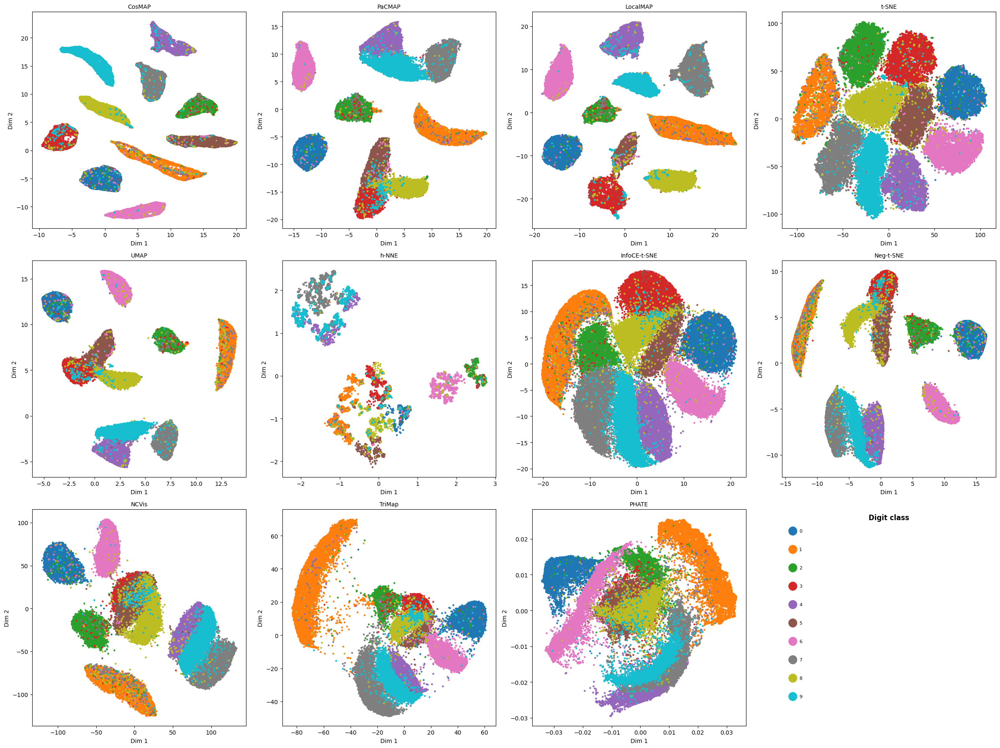


 COLOR SUMMARY:
 Legend title: Digit class
Saved: Image_comparison_with_seed_23/embeddings_comparison_mnist_seed_23.png

Plotting USPS
Loading: resultings_2d_embeddings/all_embeddings_dict_23_USPS.npy
Shape of y=(9298,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_USPS_seed_23.png


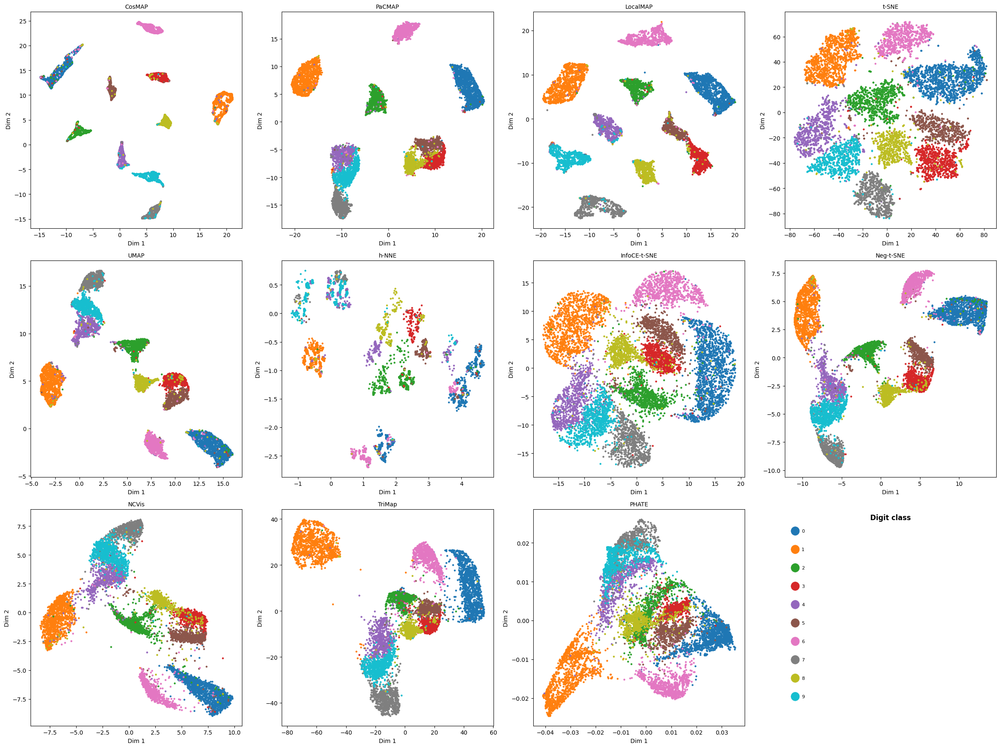


 COLOR SUMMARY:
 Legend title: Digit class
Saved: Image_comparison_with_seed_23/embeddings_comparison_USPS_seed_23.png

Plotting retina
Loading: resultings_2d_embeddings/all_embeddings_dict_23_retina.npy
Shape of y=(19829,) ====================
Using CUSTOM colors for 15 labels...
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_retina_seed_23.png


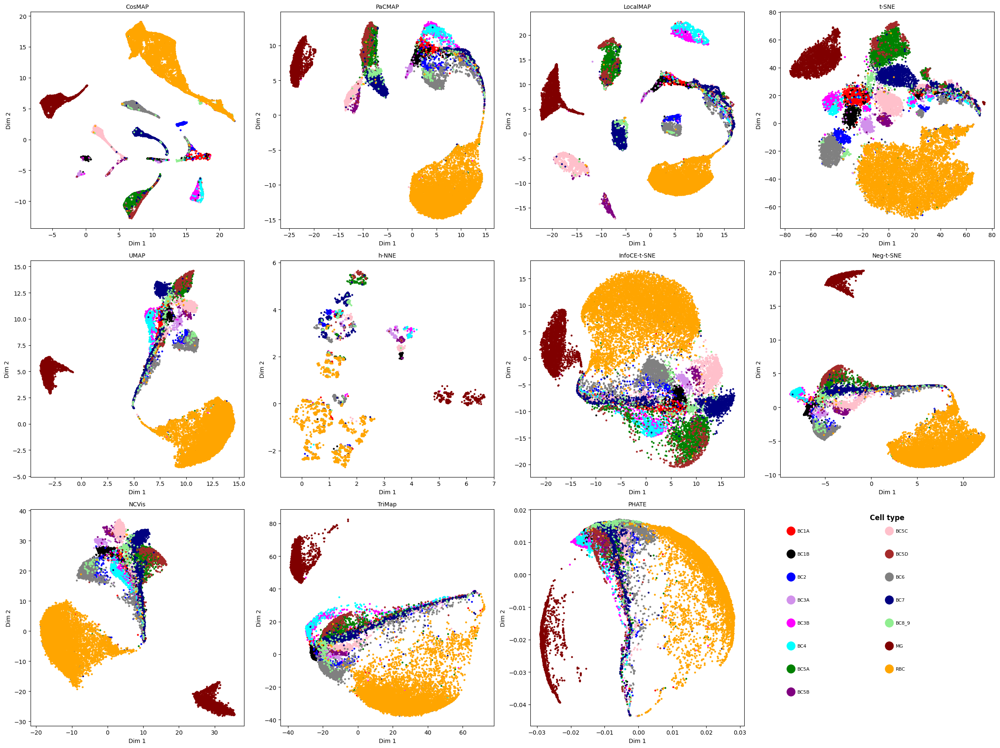


 COLOR SUMMARY:
 Legend title: Cell type
Saved: Image_comparison_with_seed_23/embeddings_comparison_retina_seed_23.png

Plotting kinship_rrq
Loading: resultings_2d_embeddings/all_embeddings_dict_23_kinship_rrq.npy
Shape of y=(665,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_kinship_rrq_seed_23.png


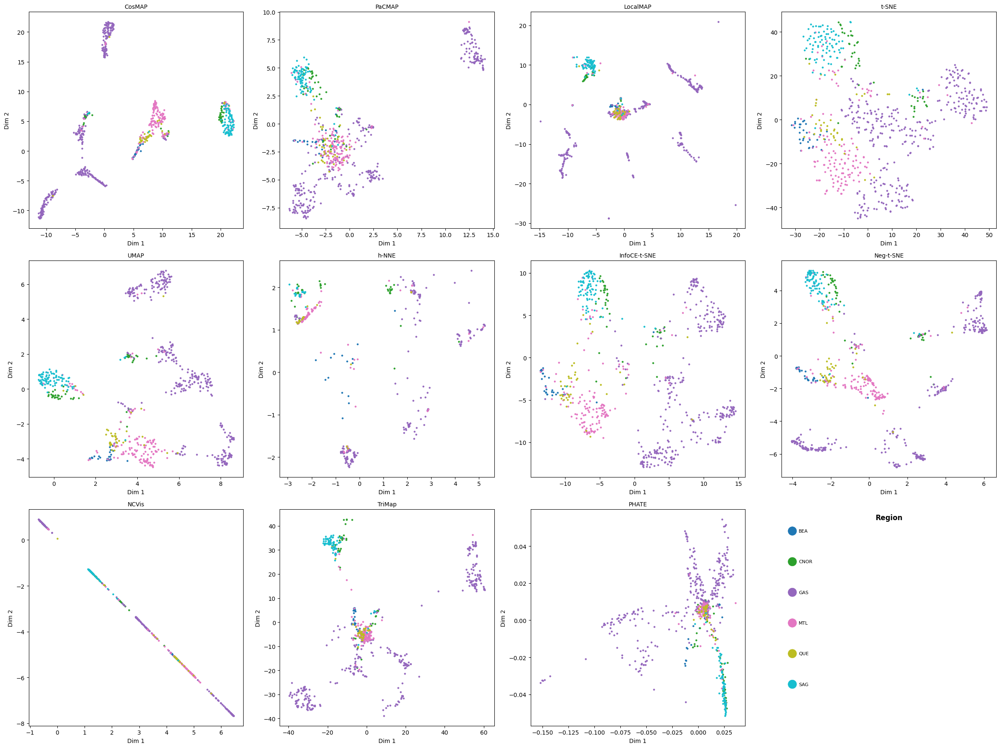


 COLOR SUMMARY:
 Legend title: Region
Saved: Image_comparison_with_seed_23/embeddings_comparison_kinship_rrq_seed_23.png

Plotting kinship_cartagene
Loading: resultings_2d_embeddings/all_embeddings_dict_23_kinship_cartagene.npy
Shape of y=(8408,) ====================
Using CUSTOM colors for 25 labels...
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_kinship_cartagene_seed_23.png


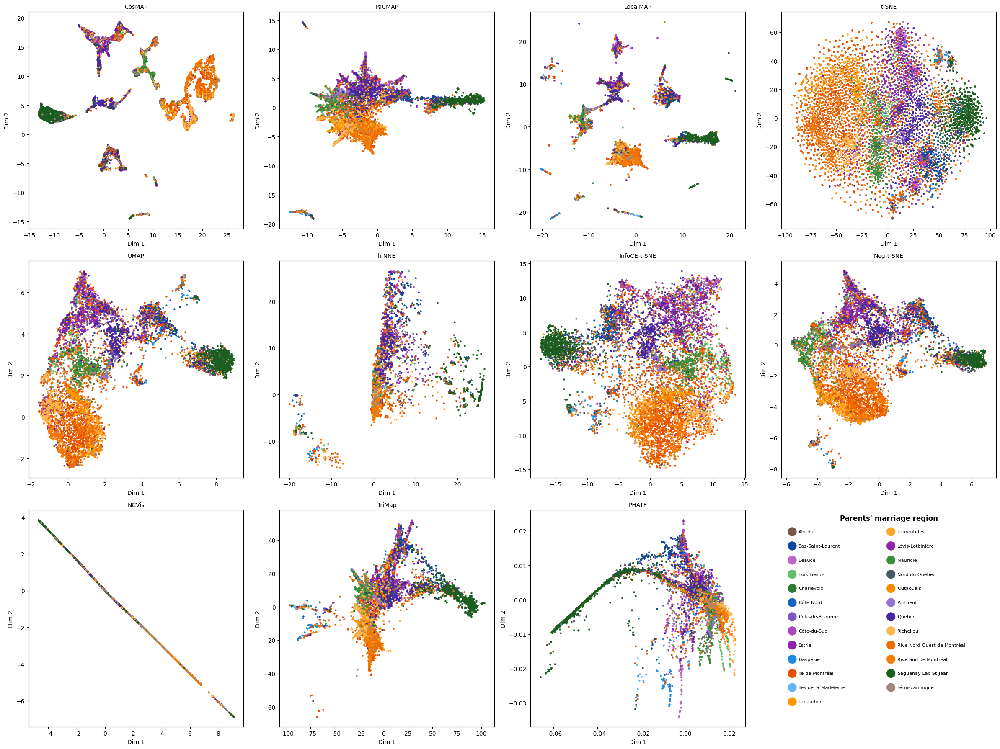


 COLOR SUMMARY:
 Legend title: Parents' marriage region
 Excluded labels: ['Unknown']
Saved: Image_comparison_with_seed_23/embeddings_comparison_kinship_cartagene_seed_23.png

Plotting cortex
Loading: resultings_2d_embeddings/all_embeddings_dict_23_cortex.npy
Shape of y=(3005,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_cortex_seed_23.png


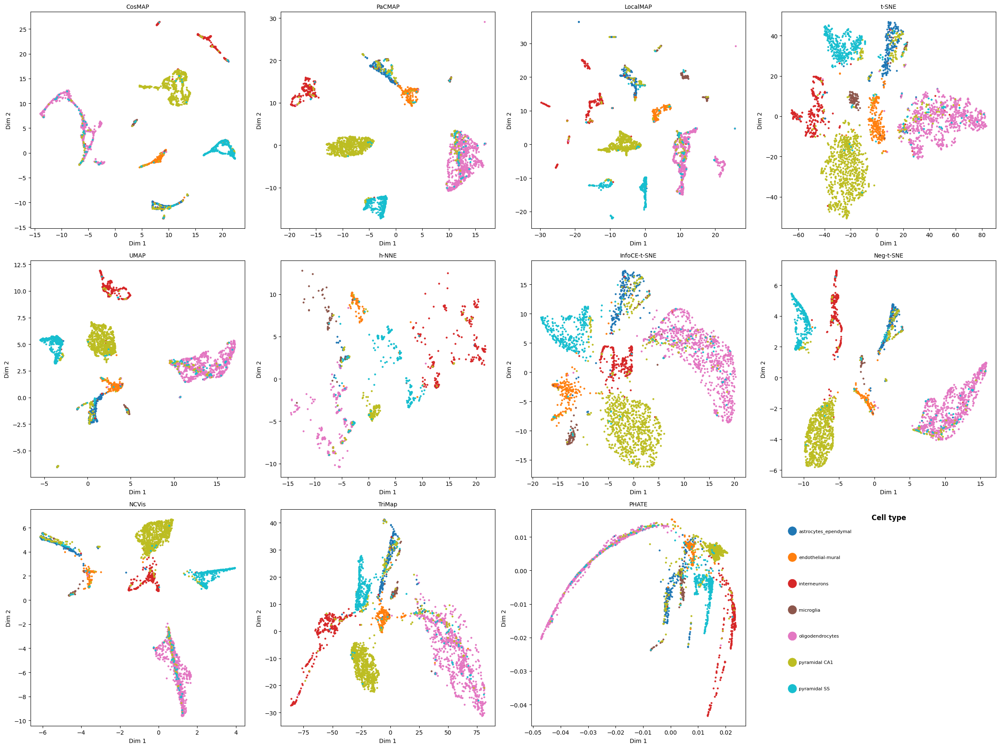


 COLOR SUMMARY:
 Legend title: Cell type
Saved: Image_comparison_with_seed_23/embeddings_comparison_cortex_seed_23.png

Plotting pbmc
Loading: resultings_2d_embeddings/all_embeddings_dict_23_pbmc.npy
Shape of y=(11990,) ====================
Using CUSTOM colors for 9 labels...
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_pbmc_seed_23.png


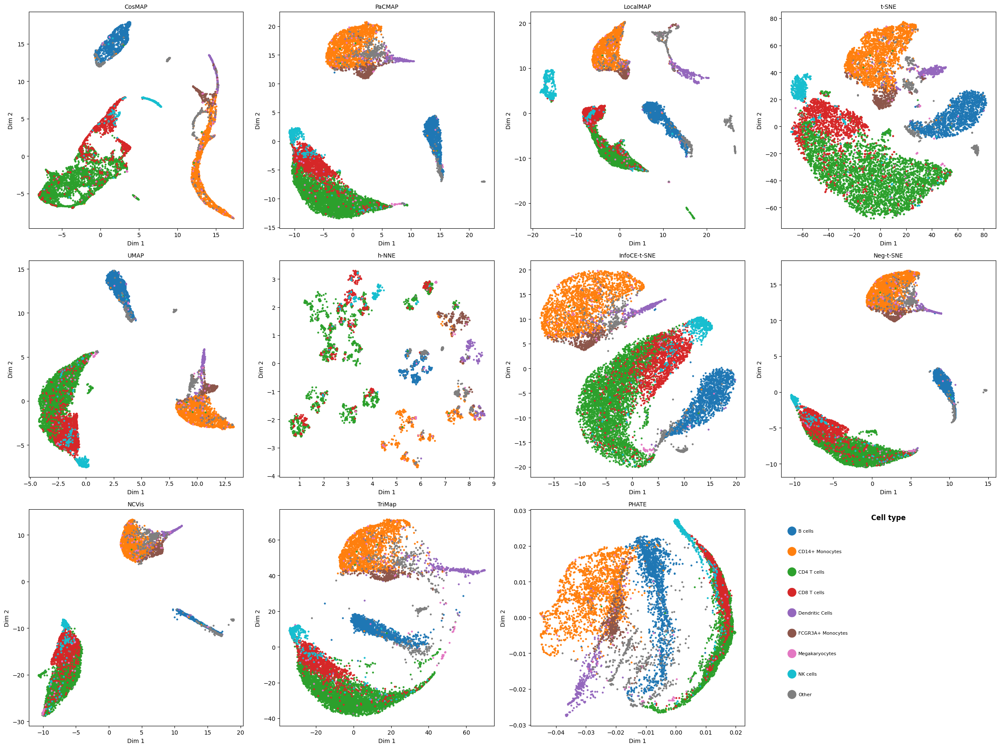


 COLOR SUMMARY:
 Legend title: Cell type
Saved: Image_comparison_with_seed_23/embeddings_comparison_pbmc_seed_23.png

Plotting paul15
Loading: resultings_2d_embeddings/all_embeddings_dict_23_paul15.npy
Shape of y=(2730,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_paul15_seed_23.png


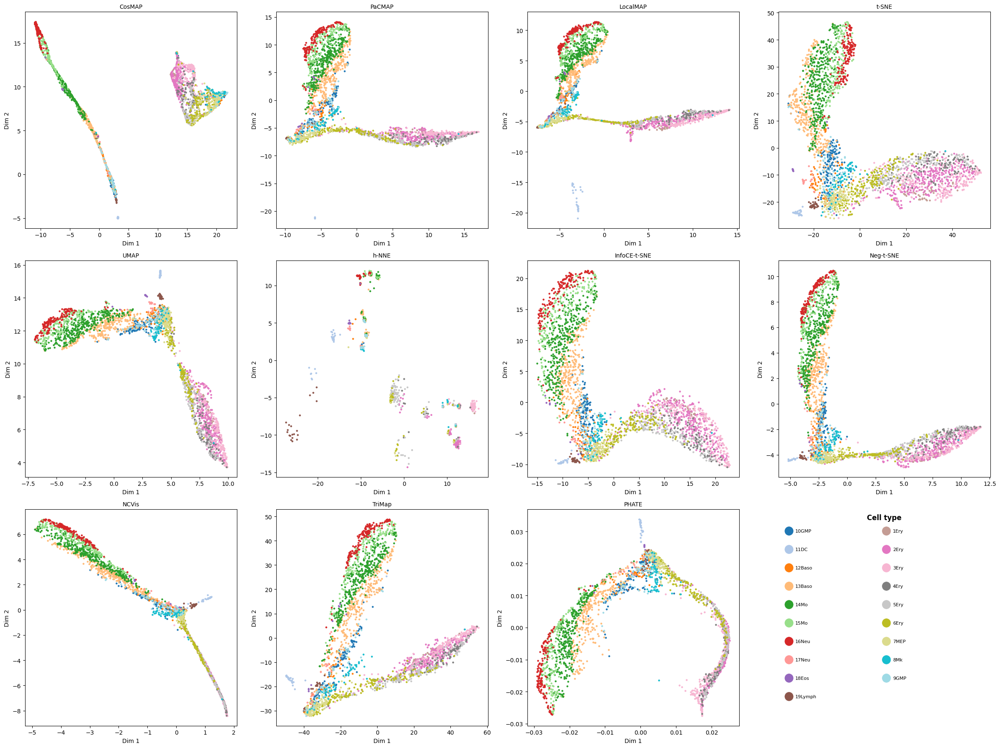


 COLOR SUMMARY:
 Legend title: Cell type
Saved: Image_comparison_with_seed_23/embeddings_comparison_paul15_seed_23.png

Plotting fmnist
Loading: resultings_2d_embeddings/all_embeddings_dict_23_fmnist.npy
Shape of y=(70000,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_fmnist_seed_23.png


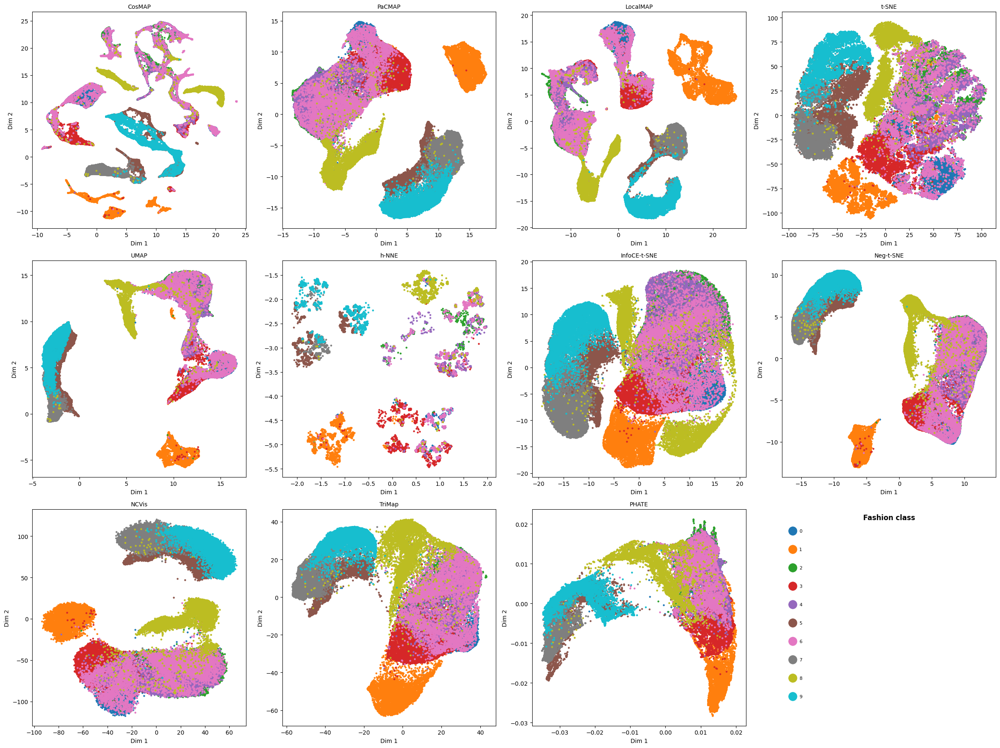


 COLOR SUMMARY:
 Legend title: Fashion class
Saved: Image_comparison_with_seed_23/embeddings_comparison_fmnist_seed_23.png

Plotting coil_20
Loading: resultings_2d_embeddings/all_embeddings_dict_23_coil_20.npy
Shape of y=(1440,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_coil_20_seed_23.png


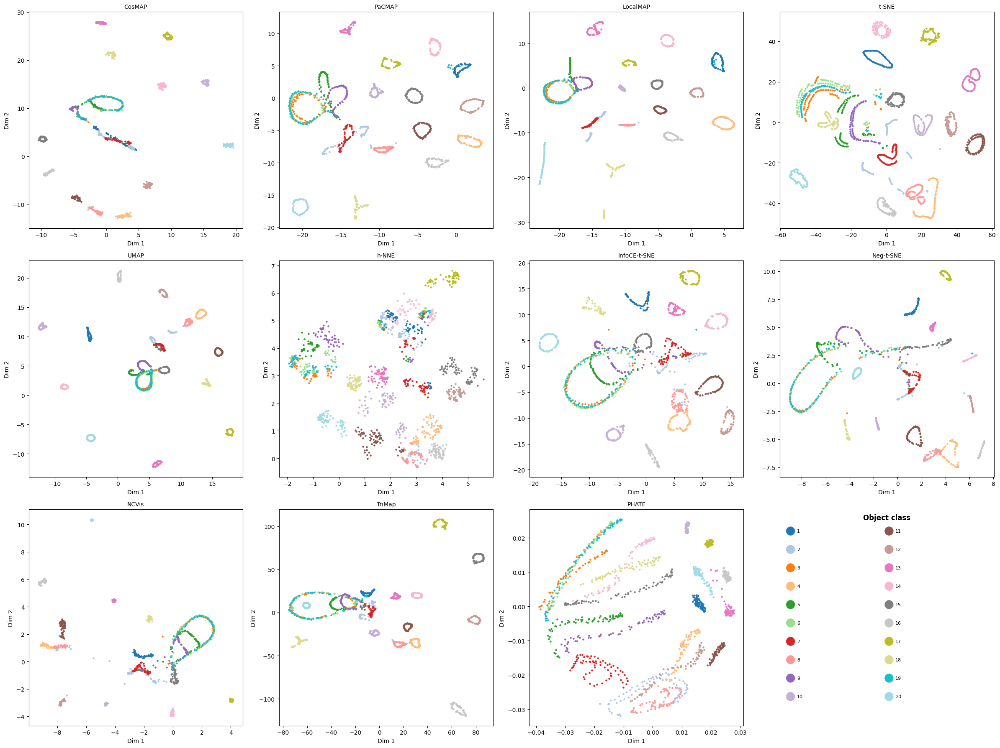


 COLOR SUMMARY:
 Legend title: Object class
Saved: Image_comparison_with_seed_23/embeddings_comparison_coil_20_seed_23.png

Plotting 20NG
Loading: resultings_2d_embeddings/all_embeddings_dict_23_20NG.npy
Shape of y=(18846,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_20NG_seed_23.png


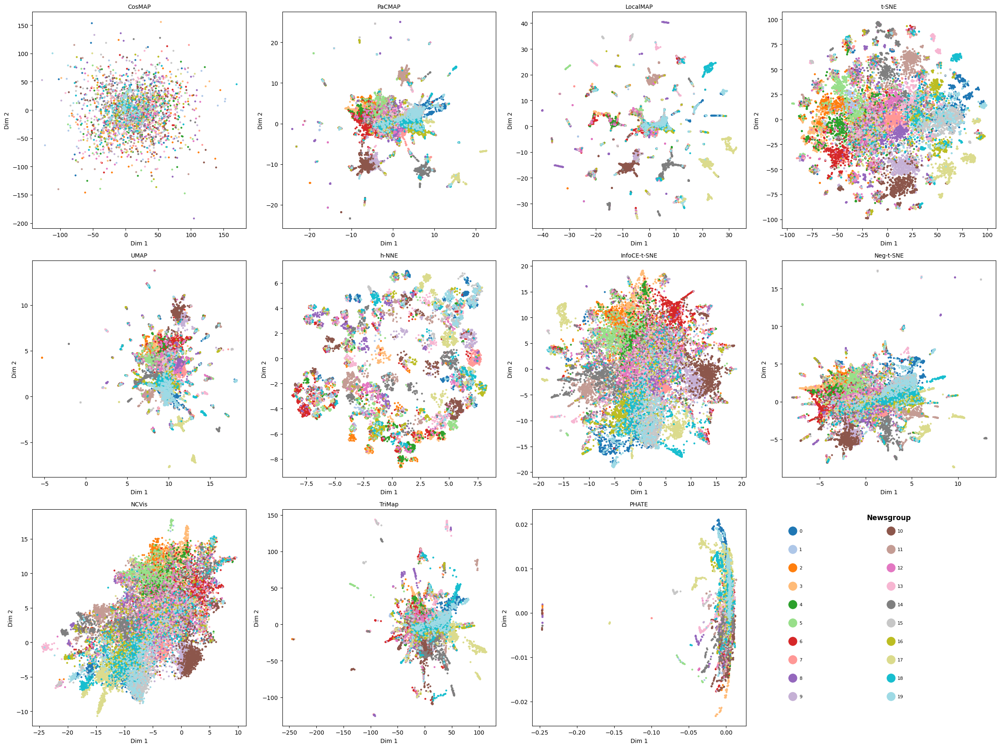


 COLOR SUMMARY:
 Legend title: Newsgroup
Saved: Image_comparison_with_seed_23/embeddings_comparison_20NG_seed_23.png

Plotting heart_cell_atlas
Loading: resultings_2d_embeddings/all_embeddings_dict_23_heart_cell_atlas.npy
Shape of y=(18641,) ====================
 Created output folder: Image_comparison_with_seed_23
 Saved plot: Image_comparison_with_seed_23/embeddings_comparison_heart_cell_atlas_seed_23.png


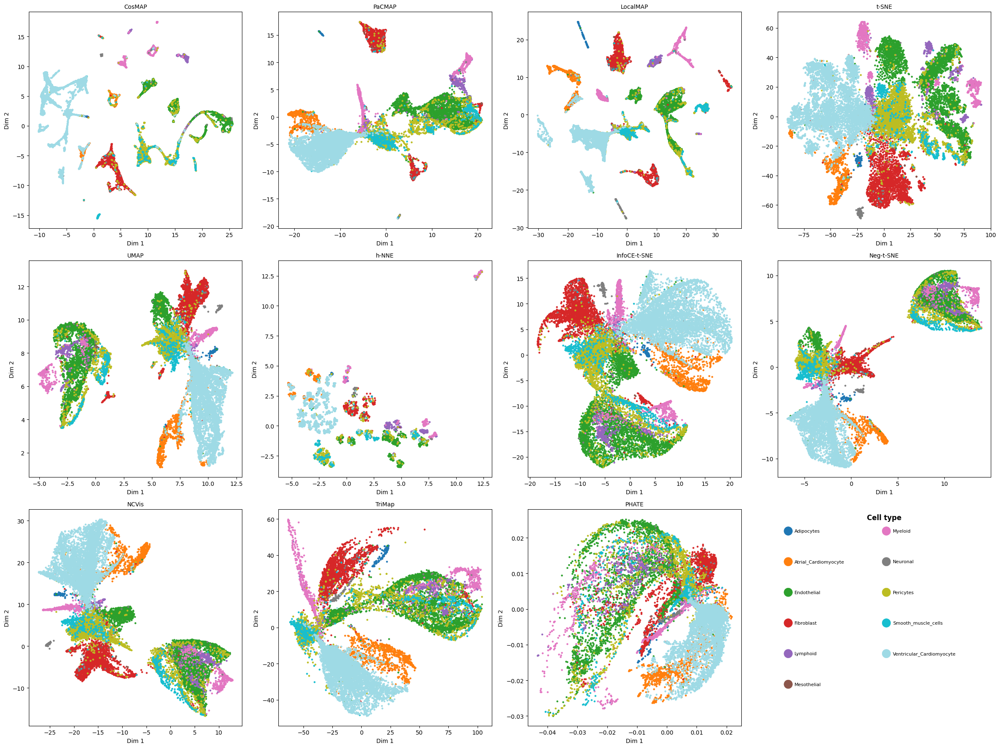


 COLOR SUMMARY:
 Legend title: Cell type
Saved: Image_comparison_with_seed_23/embeddings_comparison_heart_cell_atlas_seed_23.png


In [24]:
plot_results = {}
SEED = 23
RESULTS_DIR = Path("resultings_2d_embeddings")
for data_name in DATA_NAMES:
    file_path = (
        RESULTS_DIR
        / f"all_embeddings_dict_{SEED}_{data_name}.npy"
    )

    if not file_path.exists():
        print(f"[SKIPPED] File not found: {file_path}")
        continue

    print(f"\nPlotting {data_name}")
    print(f"Loading: {file_path}")

    embeddings_dict = np.load(
        file_path,
        allow_pickle=True,
    ).item()

    config = PLOT_CONFIG[data_name]

    fig, output_path = plot_embeddings_comparison(
        embeddings_dict=embeddings_dict,
        data_name=data_name,
        random_state=SEED,
        output_dir=f"Image_comparison_with_seed_{SEED}",
        custom_colors=config["custom_colors"],
        exclude_labels=config["exclude_labels"],
        labels_name=config["labels_name"],
        label_names=None,
        dpi=200,
        figure_size=(24, 18),
        point_size=5,
        save_plot=True,
        show_plot=True,
    )

    plot_results[data_name] = {
        "figure": fig,
        "output_path": output_path,
        "embedding_file": file_path,
    }

    print(f"Saved: {output_path}")